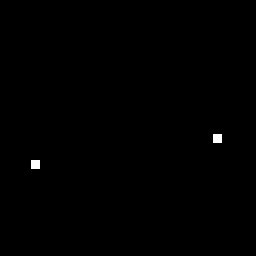

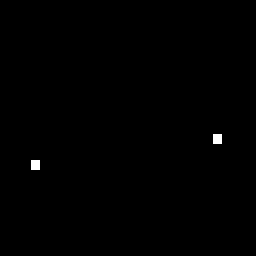

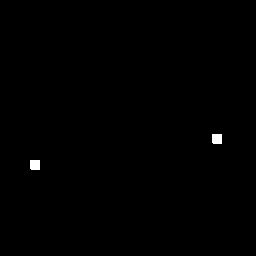

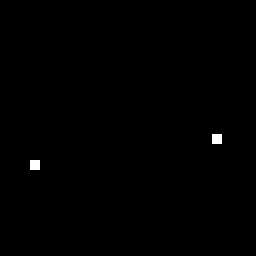

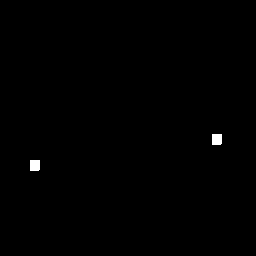

...

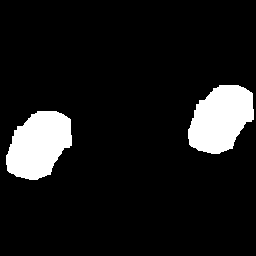

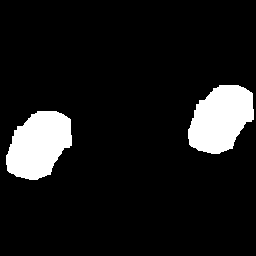

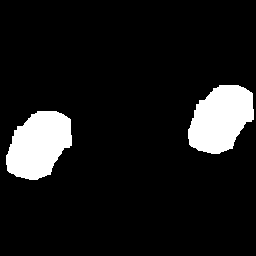

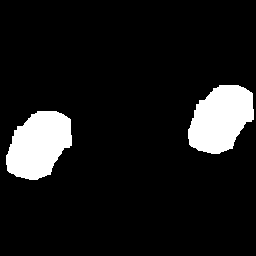

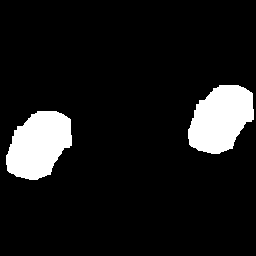

0.09278350515463918


In [ ]:
import cv2
import numpy as np
from math import sqrt
from google.colab.patches import cv2_imshow

class DetectionofCopyMoveForgery:
    def __init__(self, img, height, width, blocksize, oklid_threshold, correlation_threshold, vec_len_threshold, num_ofvector_threshold):
        self.img = img
        self.height = height
        self.width = width
        self.blocksize = blocksize
        self.oklid_threshold = oklid_threshold
        self.correlation_threshold = correlation_threshold
        self.vec_len_threshold = vec_len_threshold
        self.num_ofvector_threshold = num_ofvector_threshold
        self.block_vector = []
        self.sizeof_vector = 16
        self.hough_space = np.zeros((self.height, self.width, 2))
        self.shiftvector = []


    def detection_forgery(self):
        self.dct_of_img()
        self.lexicographically_sort_of_vectors()
        self.correlation_of_vectors()
        max = -1
        for i in range(self.height):
            for j in range(self.width):
                for h in range(2):
                    if self.hough_space[i][j][h] > max:
                        max = self.hough_space[i][j][h]
        for i in range(self.height):
            for j in range(self.width):
                self.img[i][j] = 0
        for i in range(self.height):
            for j in range(self.width):
                for h in range(2):
                    if self.hough_space[i][j][h] >= (max - (max * self.num_ofvector_threshold / 100)):
                        for k in range(len(self.shiftvector)):
                            if (self.shiftvector[k][0] == j and self.shiftvector[k][1] == i and self.shiftvector[k][2] == h):
                                cv2.rectangle(self.img, (self.shiftvector[k][3], self.shiftvector[k][4]),
                                              (self.shiftvector[k][3] + self.blocksize,
                                               self.shiftvector[k][4] + self.blocksize), (255), -1)
                                cv2.rectangle(self.img, (self.shiftvector[k][5], self.shiftvector[k][6]),
                                              (self.shiftvector[k][5] + self.blocksize,
                                               self.shiftvector[k][6] + self.blocksize), (255), -1)
                                cv2_imshow(self.img) # Changed cv2.imshow to cv2_imshow

    def dct_of_img(self):
        for r in range(0, self.height - self.blocksize, 1):
            for c in range(0, self.width - self.blocksize, 1):
                block = self.img[r:r + self.blocksize, c:c + self.blocksize]
                imf = np.float32(block)
                dct = cv2.dct(imf)
                QUANTIZATION_MAT_90 = np.array([[3, 2, 2, 3, 5, 8, 10, 12], [2, 2, 3, 4, 5, 12, 12, 11],
                                                 [3, 3, 3, 5, 8, 11, 14, 11], [3, 3, 4, 6, 10, 17, 16, 12],
                                                 [4, 4, 7, 11, 14, 22, 21, 15], [5, 7, 11, 13, 16, 12, 23, 18],
                                                 [10, 13, 16, 17, 21, 24, 24, 21], [14, 18, 19, 20, 22, 20, 20, 20]])
                dct = np.round(np.divide(dct, QUANTIZATION_MAT_90)).astype(int)
                dct = (dct / 4).astype(int)
                self.significant_part_extraction(self.zigzag(dct), c, r)

    def zigzag(self, matrix):
        vector = []
        n = len(matrix) - 1
        i = 0
        j = 0
        for _ in range(n * 2):
            vector.append(matrix[i][j])
            if j == n:
                i += 1
                while i != n:
                    vector.append(matrix[i][j])
                    i += 1
                    j -= 1
            elif i == 0:
                j += 1
                while j != 0:
                    vector.append(matrix[i][j])
                    i += 1
                    j -= 1
            elif i == n:
                j += 1
                while j != n:
                    vector.append(matrix[i][j])
                    i -= 1
                    j += 1
            elif j == 0:
                i += 1
                while i != 0:
                    vector.append(matrix[i][j])
                    i -= 1
                    j += 1
                vector.append(matrix[i][j])
        return vector

    def significant_part_extraction(self, vector, x, y):
        del vector[self.sizeof_vector:(self.blocksize * self.blocksize)]
        vector.append(x)
        vector.append(y)
        self.block_vector.append(vector)

    def lexicographically_sort_of_vectors(self):
        self.block_vector = np.array(self.block_vector)
        self.block_vector = self.block_vector[
            np.lexsort(np.rot90(self.block_vector)[2:(self.sizeof_vector + 1) + 2, :])]

    def correlation_of_vectors(self):
        for i in range(len(self.block_vector)):
            if (i + self.correlation_threshold >= len(self.block_vector)):
                self.correlation_threshold -= 1
            for j in range(i + 1, i + self.correlation_threshold + 1):
                if (self.oklid(self.block_vector[i], self.block_vector[j], self.sizeof_vector) <=
                        self.oklid_threshold):
                    v1 = []
                    v2 = []
                    v1.append(int(self.block_vector[i][-2]))
                    v1.append(int(self.block_vector[i][-1]))
                    v2.append(int(self.block_vector[j][-2]))
                    v2.append(int(self.block_vector[j][-1]))
                    self.elimination_of_weak_vectors(v1, v2, 2)

    def elimination_of_weak_vectors(self, vector1, vector2, size):
        if (self.oklid(vector1, vector2, size) >= self.vec_len_threshold):
            self.elimination_of_weak_area(vector1, vector2)

    def elimination_of_weak_area(self, vector1, vector2):
        c = abs(vector2[0] - vector1[0])
        r = abs(vector2[1] - vector1[1])
        if (vector2[0] >= vector1[0]):
            if (vector2[1] >= vector1[1]):
                z = 0
            else:
                z = 1
        if (vector1[0] > vector2[0]):
            if (vector1[1] >= vector2[1]):
                z = 0
            else:
                z = 1
        self.hough_space[r][c][z] += 1
        vector = []
        vector.append(c)
        vector.append(r)
        vector.append(z)
        vector.append(vector1[0])
        vector.append(vector1[1])
        vector.append(vector2[0])
        vector.append(vector2[1])
        self.shiftvector.append(vector)

    def oklid(self, vector1, vector2, size):
        sum = 0
        for i in range(size):
            sum += (vector2[i] - vector1[i]) ** 2
        return sqrt(sum)

def getFmeasure(orginal_img, test_img, width, height):
    DP = 0
    YP = 0
    YN = 0
    for i in range(height):
        for j in range(width):
            if orginal_img[i][j] == 255 and test_img[i][j] == 255:
                DP += 1
            if orginal_img[i][j] == 0 and test_img[i][j] == 255:
                YP += 1
            if orginal_img[i][j] == 255 and test_img[i][j] == 0:
                YN += 1
    precision = DP / (DP + YP)
    recall = DP / (DP + YN)
    return 2 * ((precision * recall) / (precision + recall))

if __name__ == "__main__":
    img = cv2.imread("/content/forged1.png", 0)
    height, width = img.shape
    asd = DetectionofCopyMoveForgery(img, height, width, 8, 3.5, 8, 100, 5)
    asd.detection_forgery()
    cv2.waitKey(0)
    original_img = cv2.imread("/content/img_o1.jpg", 0)
    print(getFmeasure(original_img, img, width, height))
    cv2.destroyAllWindows()
